# EDA for Tanzanian Water Wells Analysis and Classification

## Imports and Constants

In [1]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import folium
from folium import plugins
import datetime
import sidetable as stb

/Users/freethrall/anaconda3/envs/learn-env/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# location of datafiles
DATA_PATH = 'data/'
SAVE_MEMORY = True # don't show maps

## Helper Functions

In [3]:
def draw_heatmap(df, save_memory=False):
    """
    Draw a heatmap of the instances in a dataframe based upon their latitude
    and longitude.
    
    Parameters:
    df: dataframe with locations
    save_memory: when set to true the map will not be rendered.  Helpful when
        running out of memory.
    """
    
    if not save_memory:
        lat_long_matrix = df[['latitude', 'longitude']].to_numpy()

        map_ = folium.Map([-6.369, 34.8888], zoom_start=5)

        map_.add_child(plugins.HeatMap(lat_long_matrix, radius=10))

        display(map_)

In [4]:
def map_point(lat, long, save_memory=False):
    """
    Display a single location on a map
    
    Parameters:
    lat, long: the location
    save_memory: when set to true the map will not be rendered.  Helpful when
        running out of memory.
    """
    
    if not save_memory:
        map_ = folium.Map([lat, long], zoom_start=18)
        folium.Marker([lat,long],).add_to(map_)
        display(map_)

In [58]:
def print_data_range(data):
    """Print the min, max, mean and median of a series"""
    print(f"min {data.min()}")
    print(f"max {data.max()}")
    print(f"mean {data.mean()}")
    print(f"median {data.median()}")

## Read in the Data

In [5]:
features_df = pd.read_csv(DATA_PATH + 'water_wells_training_features.csv', parse_dates=['date_recorded'])
labels_df = pd.read_csv(DATA_PATH + 'water_wells_training_labels.csv')

In [6]:
features_df.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [7]:
labels_df.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


In [8]:
# combine the features and labels into a single dataframe
data = pd.concat([features_df, labels_df.status_group], axis=1)
data.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


## Initial Inspection of Data

### Check for missing data

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     59400 non-null  int64         
 1   amount_tsh             59400 non-null  float64       
 2   date_recorded          59400 non-null  datetime64[ns]
 3   funder                 55765 non-null  object        
 4   gps_height             59400 non-null  int64         
 5   installer              55745 non-null  object        
 6   longitude              59400 non-null  float64       
 7   latitude               59400 non-null  float64       
 8   wpt_name               59400 non-null  object        
 9   num_private            59400 non-null  int64         
 10  basin                  59400 non-null  object        
 11  subvillage             59029 non-null  object        
 12  region                 59400 non-null  object        
 13  r

In [10]:
print('Number of missing values per feature')
data.isna().sum()

Number of missing values per feature


id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [11]:
print('Percentage of missing values per feature')
round(data.isna().sum() * 100 / len(data), 2)

Percentage of missing values per feature


id                        0.00
amount_tsh                0.00
date_recorded             0.00
funder                    6.12
gps_height                0.00
installer                 6.15
longitude                 0.00
latitude                  0.00
wpt_name                  0.00
num_private               0.00
basin                     0.00
subvillage                0.62
region                    0.00
region_code               0.00
district_code             0.00
lga                       0.00
ward                      0.00
population                0.00
public_meeting            5.61
recorded_by               0.00
scheme_management         6.53
scheme_name              47.42
permit                    5.14
construction_year         0.00
extraction_type           0.00
extraction_type_group     0.00
extraction_type_class     0.00
management                0.00
management_group          0.00
payment                   0.00
payment_type              0.00
water_quality             0.00
quality_

**Summary of Initial Inspection**

The initial inspection of the data shows that there are 7 features with NAN values.  Further inspection will be needed to decide how to handle the missing values and any placeholder values that are found.

### Summary of all Features & Labels

In [12]:
ProfileReport(data, minimal=True)

### Summary of features with NaN, placeholder, or bad data

* NaN
    * Funder
    * Installer
    * Subvillage
    * public meeting
    * scheme management
    * scheme name
    * permit
* Placeholder
    * amount_tsh - 0
    * gps_height - 0
    * installer - 0
    * longitude - 0
    * num_private - 0
    * population - 0
    * construction year - 0
    * wpt_name - none
    * extraction_type - other
    * extraction_type_group - other
    * extraction_type_class - other
    * management - unknown
    * management_group - unknown, other
    * payment - unknown, other
    * payment_type - unknown, other
    * water_quality - unknown
    * quality_group - unknown
    * quantity - unknown
    * quantity_group - unknown
    * source - other, unknown
    * source_type - other
    * source_class - unknown
    * waterpoint_type - other
    * waterpoint_type_group - other
* Bad Data
    * gps_height - negative values (lowest point is 0M at the Indian Ocean)
    * installer - typos and similar entries
    * population - 30,500 (potential bad data)
    * scheme_name - typos
    * date_recorded - 2002 is probably 2012
    

**There is a lot of missing data. Each feature will need to be investigated further with regard to how to handle it.  Should data be imputed, and if so how? Should data be dropped?**

## Detailed inspection of each feature

### id

An index, not relevant to analysis

### amount_tsh

Total static head (amount water available to waterpoint). 

"the elevation between the surface of the reservoir and the point of discharge into the receiving tank" from Pumpfundamentals.com

#### EDA

In [13]:
tsh_zero_df = data[data['amount_tsh'] == 0]

In [14]:
# ProfileReport(tsh_zero_df)

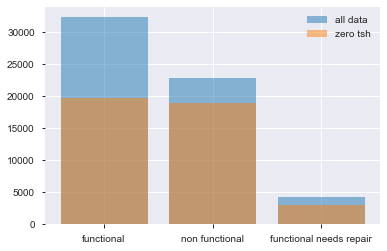

In [15]:
plt.bar(data.status_group.unique(), data.status_group.value_counts(), alpha=0.5, label='all data')
plt.bar(tsh_zero_df.status_group.unique(), tsh_zero_df.status_group.value_counts(), alpha=0.5, label='zero tsh')
plt.legend();

Heatmap of waterpumps with amount_tsh set to 0

In [16]:
draw_heatmap(tsh_zero_df, save_memory=SAVE_MEMORY)

Heatmap of Water Pumps with amount_tsh defined

In [17]:
draw_heatmap(data[data['amount_tsh'] != 0], save_memory=SAVE_MEMORY)

#### Findings

**Summary**

Very high percentages of the non-functional and functional needs repair water pumps do not have an amount_tsh defined.  A majority of the functional water pumps do not have an amount_tsh defined.  A total of 70/% of all waterpumps do not have amount_tsh defined.

The location of water pumps with amount_tsh set to 0 is widespread while it having a value is less widespread although overlapping the set to 0 map.

Given that 70% of the water pumps do not have this value defined will probably make it impossible to impute a value to it, meaning that it will have to be dropped.

### date_recorded

Seasons in Tanzania
* The main rainy season is: March, April, May
* The main dry season is: June, July, August, September, October
* Short rainy season is November, December
* Short dry season is January, February
* according to [expertafrica.com](https://www.expertafrica.com/tanzania/weather-and-climate)

#### EDA

In [18]:
data_df = data[data['date_recorded'] < pd.Timestamp(2011, 1, 1)]

In [19]:
len(data_df)

31

#### Findings

The 31 instances older than 2011 seem out of date.  The core of the data is between 2011 and 2013 while those instances are from 2002 to 2004. they are either a typo of old data.

#### Future Work

It may be worth splitting the data into whether the information was last recorded in a wet or dry season.  Will do this time permitting

### funder

Who funded the well

#### EDA

In [20]:
data.funder.value_counts()[0:50]

Government Of Tanzania            9084
Danida                            3114
Hesawa                            2202
Rwssp                             1374
World Bank                        1349
Kkkt                              1287
World Vision                      1246
Unicef                            1057
Tasaf                              877
District Council                   843
Dhv                                829
Private Individual                 826
Dwsp                               811
0                                  777
Norad                              765
Germany Republi                    610
Tcrs                               602
Ministry Of Water                  590
Water                              583
Dwe                                484
Netherlands                        470
Hifab                              450
Adb                                448
Lga                                442
Amref                              425
Fini Water               

In [21]:
data.funder.value_counts()[50:100]

Oxfarm                           176
Magadini-makiwaru Water          175
Fw                               173
W.B                              170
Kkkt_makwale                     166
Ces (gmbh)                       165
Wvt                              158
Oikos E.Afrika                   155
Nethalan                         152
Mkinga Distric Coun              150
Lvia                             147
Concern World Wide               145
Unhcr                            137
No                               134
Swedish                          131
African                          128
Community                        126
Anglican Church                  126
Is                               125
He                               125
Ki                               124
Tardo                            123
Ir                               123
Wananchi                         122
Snv                              122
Roman Catholic                   121
Wua                              121
U

In [22]:
data.funder.value_counts()[100:150]

Japan                          82
Cmsr                           81
Rc Ch                          80
Ndrdp                          78
Vwc                            78
Lwi                            72
Kuwait                         72
Fin Water                      72
Cdtf                           70
Kkkt Church                    70
Caritas                        70
Padep                          69
Kaemp                          69
Marafip                        68
Kibaha Town Council            68
Water Aid /sema                68
Conce                          68
Cefa                           67
Ncaa                           63
Mkinga  Distric Cou            62
Losaa-kia Water Supply         62
National Rural                 62
Commu                          62
Md                             61
Irish Ai                       59
Sabemo                         59
Plan International             57
Twesa                          56
Kirde                          54
Gen           

In [23]:
data.funder.value_counts()[150:200]

Dads                             46
Devon Aid Korogwe                46
Miziriol                         46
Red Cross                        45
Shawasa                          45
Redep                            44
Abasia                           43
Tz Japan                         43
Ms                               42
Giz                              42
Serikali                         41
Donor                            41
Cafod                            41
Tdft                             41
Tredep                           40
Un                               40
Soda                             40
Ka                               39
Songea District Council          38
Kuwasa                           38
Jbg                              38
Dasip                            37
Fathe                            37
Kidp                             36
Urt                              36
W                                36
Songea Municipal Counci          35
Watu Wa Ujerumani           

#### Findings

This feature has 1898 distinct features and is missing 3635 features and has 0 listed for 777 features making a total of 4412 features.

Who the funder is may have an impact of the quality of the well project, but how to use this data is a way that doesn't create high dimensionality and have a high computation cost needs to be determined.

#### Future Work

* combine Tanzanian government entities
* combine other related entities

### gps_height

Altitude of the well

#### EDA

##### From the data profile above I saw that some gps_height data was negative.  How many instances and where are they?

In [24]:
len(data[data.gps_height < 0])

1496

There are 1496 data points with an altitude less than 0, but the lowest altitude in Tanzania is 0.

In [25]:
draw_heatmap(data[data.gps_height < 0], save_memory=SAVE_MEMORY)

Interestingly all the points with altitudes less than 0 are along the coast.  

GPS readings have an normal error of +- 20 meters, and because they measure elevation with reference to an ellipsoid, the height measurements may not be true but they are accurate with reference to all the other gps_height measurements and the ellipsoid[1].

Because they are as accurate as all the other values, I will not change them.

[1 eos-gnss.com](https://eos-gnss.com/elevation-for-beginners)

##### Missing Data

There are over 20,000 missing values, about 34% of the data.  Are they concentrated in anyone area like negative values?

In [26]:
draw_heatmap(data[data.gps_height == 0], save_memory=SAVE_MEMORY)

The missing data is fairly concentrated, and with some of it along the coast and 0 value may be accurate, not just a placeholder.

I'm going to look up the elevation of the major cities with concentrations of 0's.
* Dodoma 1,100m
* Mbeya 1,700m
* Tabora 1,200m
* Shinyanga 1135m
* Bukoa 1,200m

What regions are the 0's in?

In [27]:
data[data.gps_height == 0].stb.freq(['region'])

,region,Count,Percent,Cumulative Count,Cumulative Percent
0,Shinyanga,4818,0.235737,4818,0.235737
1,Mbeya,4639,0.226979,9457,0.462717
2,Kagera,3316,0.162247,12773,0.624963
3,Mwanza,2735,0.133819,15508,0.758783
4,Dodoma,2201,0.107692,17709,0.866474
5,Tabora,1959,0.095851,19668,0.962325
6,Tanga,493,0.024122,20161,0.986447
7,Morogoro,244,0.011939,20405,0.998385
8,Pwani,24,0.001174,20429,0.999560
9,Lindi,4,0.000196,20433,0.999755


What are the min, max and mean gps_height of the Shinyanga region?

In [28]:
print(f"Min {data[(data.region == 'Shinyanga') & (data.gps_height != 0)]['gps_height'].min()}")
print(f"Max {data[(data.region == 'Shinyanga') & (data.gps_height != 0)]['gps_height'].max()}")
print(f"Mean {data[(data.region == 'Shinyanga') & (data.gps_height != 0)]['gps_height'].mean()}")
print(f"Median {data[(data.region == 'Shinyanga') & (data.gps_height != 0)]['gps_height'].median()}")

Min 1297
Max 1434
Mean 1350.9817073170732
Median 1350.5


1350 is close to the elevation of Shinyaga I Googled, but suprisingly all the elevations are above the finding on Google.

##### Findings

I will use the mean of the recorded values of each region to impute the missing gps_height values.  This will keep the data consistent.

### installer

Organization that installed the well

From above we know that this feature has a high cardinality, contains some NaN values and some with a placeholder of 0.

In [29]:
data.stb.freq(['installer'], style=True, cum_cols=False)

,installer,Count,Percent
0,DWE,"17,402",31.22%
1,Government,"1,825",3.27%
2,RWE,"1,206",2.16%
3,Commu,"1,060",1.90%
4,DANIDA,"1,050",1.88%
5,KKKT,898,1.61%
6,Hesawa,840,1.51%
7,0,777,1.39%
8,TCRS,707,1.27%
9,Central government,622,1.12%


#### Findings

Will replace 0 and NaN with 'unknown' and make everything lowercase.  Another reasonable option would be to change the missing values to the mode, DWE, but given the existing name variations keeping it as unknown may be better.

#### Future work

Check for spelling mistakes / variations, and name variations

### longitude / latitude

We know from above that there are 1812 instances where longitude is 0 (about 3%).  Surprisingly none of the latitude values are 0.  Where are these instances?

In [30]:
draw_heatmap(data[data['longitude'] == 0], save_memory=SAVE_MEMORY)

The latitude values are all in a cluster.  What region are they supposed to be in?

In [31]:
data[data['longitude'] == 0].stb.freq(['region'], cum_cols=False)

,region,Count,Percent
0,Shinyanga,1005,0.554636
1,Mwanza,807,0.445364


What is the longitude range of those two regions?

In [32]:
print(f"min {data[(data['region'] == 'Shinyanga') & (data['longitude'] != 0)]['longitude'].min()}")
print(f"max {data[(data['region'] == 'Shinyanga') & (data['longitude'] != 0)]['longitude'].max()}")
print(f"mean {data[(data['region'] == 'Shinyanga') & (data['longitude'] != 0)]['longitude'].mean()}")
print(f"median {data[(data['region'] == 'Shinyanga') & (data['longitude'] != 0)]['longitude'].median()}")

min 31.45472581
max 34.75873373
mean 33.24012071028917
median 33.43722348


In [33]:
print(f"min {data[(data['region'] == 'Mwanza') & (data['longitude'] != 0)]['longitude'].min()}")
print(f"max {data[(data['region'] == 'Mwanza') & (data['longitude'] != 0)]['longitude'].max()}")
print(f"mean {data[(data['region'] == 'Mwanza') & (data['longitude'] != 0)]['longitude'].mean()}")
print(f"median {data[(data['region'] == 'Mwanza') & (data['longitude'] != 0)]['longitude'].median()}")

min 32.04645808
max 33.75689474
mean 33.09156419778649
median 33.0818363


#### Findings

The mean longitude of the region should be imputed for the missing longitude values.  The range of longitude values is pretty small.

### wpt_name

Name of the waterpoint if there is one

#### Findings

We know from above that this feature has very high cardinality, 37,400 distinct values.  The name of the waterpoint is unlikely to have an impact on its functionality so I will drop this feature.

### num_private

this feature is not defined, but potentially means the number of private users to the well with private meaning business users

close to 99% of the waterpoints are listed as having 0 private users, which may mean unknown or actually 0.

What is the population around the well with the most private users?

In [34]:
data['num_private'].max()

1776

In [35]:
data[data['num_private'] == data['num_private'].max()]['population']

24657    20
Name: population, dtype: int64

Where is this waterpoint?

In [36]:
map_point(data[data['num_private'] == data['num_private'].max()]['latitude'],
         data[data['num_private'] == data['num_private'].max()]['longitude'], save_memory=SAVE_MEMORY)

This waterpoint presumably serves the Kilimanjaro Pharmacy School and Medical Center.  Presumably 1776 people at those institutions use the waterpoint plus potentially 20 public users.

#### Findings

Without significant effort it would be impossible to find out how many num_private values that equal 0 are unknowns vs. no private users.

I will leave this feature unchanged.

### basin

Geographic water basin

In [37]:
data.stb.freq(['basin'], style=True, cum_cols=False)

,basin,Count,Percent
0,Lake Victoria,"10,248",17.25%
1,Pangani,"8,940",15.05%
2,Rufiji,"7,976",13.43%
3,Internal,"7,785",13.11%
4,Lake Tanganyika,"6,432",10.83%
5,Wami / Ruvu,"5,987",10.08%
6,Lake Nyasa,"5,085",8.56%
7,Ruvuma / Southern Coast,"4,493",7.56%
8,Lake Rukwa,"2,454",4.13%


What is the internal basin?

In [38]:
draw_heatmap(data[data['basin'] == 'Internal'], save_memory=SAVE_MEMORY)

#### Findings

While this feature is complete a finer grain location feature may be better to use to reduce dimensionality.  There are 7 geographic features.

#### Future Work

Add back geographic features to the model to test if it improves.

### subvillage

Geographic location "Wards are further subdivided for management purposes: for urban wards into streets (mtaa in Swahili) and for rural wards into villages (kijiji in Swahili)." from [wikipedia](https://en.wikipedia.org/wiki/Subdivisions_of_Tanzania)

In [39]:
data.stb.freq(['subvillage'], style=True, cum_cols=False)

,subvillage,Count,Percent
0,Madukani,508,0.86%
1,Shuleni,506,0.86%
2,Majengo,502,0.85%
3,Kati,373,0.63%
4,Mtakuja,262,0.44%
5,Sokoni,232,0.39%
6,M,187,0.32%
7,Muungano,172,0.29%
8,Mbuyuni,164,0.28%
9,Mlimani,152,0.26%


There are over 19,000 subvillages with 371 missing values.

Where is Madukani located?  Since it has the largest amount of waterpoints.

In [40]:
draw_heatmap(data[data['subvillage'] == 'Madukani'], save_memory=SAVE_MEMORY)

As shown on the map, Madukani is a very common village/street name and would not be meaningful in a model without other regional features.

What other geograpic features include Madukani?

In [41]:
data[data['subvillage'] == 'Madukani'].stb.freq(['region', 'lga', 'ward'], style=True, cum_cols=False)

,region,lga,ward,Count,Percent
0,Mwanza,Magu,Nkungulu,19,3.74%
1,Manyara,Simanjiro,Naberera,16,3.15%
2,Arusha,Ngorongoro,Malambo,16,3.15%
3,Arusha,Longido,Longido,16,3.15%
4,Lindi,Nachingwea,Lionja,12,2.36%
5,Shinyanga,Maswa,Shishiyu,11,2.17%
6,Arusha,Longido,Ketumbeine,10,1.97%
7,Arusha,Ngorongoro,Endulen,9,1.77%
8,Arusha,Longido,Tingatinga,9,1.77%
9,Arusha,Arusha Rural,Oldonyosambu,9,1.77%


159 combinations of region, lga and ward.

Where are the instances with missing values located?

In [42]:
draw_heatmap(data[data['subvillage'].isna()], save_memory=SAVE_MEMORY)

#### Findings

A high cardinality feature, that will be helpful drilling down to location.  The missing data is clustered in two locations.  The missing data will be set to 'unknown' because gathering the actual values if they exist would be too time consuming and imputing some other value would probably not add any information or help the model.

### region

Geographic location

"Tanzania is divided into thirty-one regions (mkoa in Swahili)." [wikipedia](https://en.wikipedia.org/wiki/Subdivisions_of_Tanzania)

In [46]:
data.stb.freq(['region'], style=True, cum_cols=False, sort_cols=True)

,region,Count,Percent
0,Arusha,"3,350",5.64%
1,Dar es Salaam,805,1.36%
2,Dodoma,"2,201",3.71%
3,Iringa,"5,294",8.91%
4,Kagera,"3,316",5.58%
5,Kigoma,"2,816",4.74%
6,Kilimanjaro,"4,379",7.37%
7,Lindi,"1,546",2.60%
8,Manyara,"1,583",2.66%
9,Mara,"1,969",3.31%


Although there are currently 31 regions, 5 were created since the data was collected and there are some extremely small regions that are not represented at all, probably due to a lack of data collection.

#### Findings

This feature will have no changes

### region_code

In [47]:
data.stb.freq(['region_code'], style=True, cum_cols=False, sort_cols=True)

,region_code,Count,Percent
0,1,"2,201",3.71%
1,2,"3,024",5.09%
2,3,"4,379",7.37%
3,4,"2,513",4.23%
4,5,"4,040",6.80%
5,6,"1,609",2.71%
6,7,805,1.36%
7,8,300,0.51%
8,9,390,0.66%
9,10,"2,640",4.44%


#### findings

It's not clear what these codes refer to; they don't coincide with the region names.

They will be dropped.

### district_code

In [50]:
data.stb.freq(['region', 'district_code'], style=True, cum_cols=False, sort_cols=True)

,region,district_code,Count,Percent
0,Arusha,1,189,0.32%
1,Arusha,2,"1,206",2.03%
2,Arusha,3,109,0.18%
3,Arusha,5,201,0.34%
4,Arusha,6,310,0.52%
5,Arusha,7,"1,009",1.70%
6,Arusha,30,326,0.55%
7,Dar es Salaam,1,93,0.16%
8,Dar es Salaam,2,497,0.84%
9,Dar es Salaam,3,215,0.36%


#### Findings

An encoding of the districts within each region.  The codes are not unique across the country, just the region.  The are also nominal and being given an ordinal code could confuse a model.  I will drop this feature and use the district name instead.

### lga

District Names - the division under region

In [51]:
data.stb.freq(['region', 'lga'], style=True, cum_cols=False, sort_cols=True)

,region,lga,Count,Percent
0,Arusha,Arusha Rural,"1,252",2.11%
1,Arusha,Arusha Urban,63,0.11%
2,Arusha,Karatu,326,0.55%
3,Arusha,Longido,310,0.52%
4,Arusha,Meru,"1,009",1.70%
5,Arusha,Monduli,189,0.32%
6,Arusha,Ngorongoro,201,0.34%
7,Dar es Salaam,Ilala,497,0.84%
8,Dar es Salaam,Kinondoni,93,0.16%
9,Dar es Salaam,Temeke,215,0.36%


#### Findings

These district names do coincide to the district codes.  I will use this feature since it is a nominal feature, and the non-distinct codes would confuse the model.

### ward

The division under District

This feature has high cardinality.  Let's look at the ward in the Arusha region, Arusha Rural lga

In [53]:
data[(data['region'] == 'Arusha') & (data['lga'] == 'Arusha Rural')].stb.freq(['ward'], style=True, cum_cols=False, sort_cols=True)

,ward,Count,Percent
0,Bangata,33,2.64%
1,Bwawani,37,2.96%
2,Ilkiding'a,86,6.87%
3,Kimnyaki,79,6.31%
4,Kiranyi,115,9.19%
5,Kisongo,33,2.64%
6,Mateves,22,1.76%
7,Mlangarini,92,7.35%
8,Moivo,44,3.51%
9,Moshono,44,3.51%


20 wards in that location

#### Findings

This feature will be used as is.

### population

Population around the well

As seen above, 35% of the data is set to 0.

Where are all the zeros?

In [54]:
draw_heatmap(data[data['population'] == 0], save_memory=False)

How about the not zeros?

In [55]:
draw_heatmap(data[data['population'] != 0], save_memory=False)

There looks to be little overlap in the instances, so the data collectors consistently either collected it or didn't.

What is the range of the non-zero populations?

In [57]:
print_data_range(data[data['population'] != 0]['population'])

min 1
max 30500
mean 281.08716694284436
median 150.0


In [62]:
data[data['population'] != 0].stb.freq(['region'], style=True, cum_cols=False, sort_cols=True)

,region,Count,Percent
0,Arusha,"3,349",8.81%
1,Dar es Salaam,805,2.12%
2,Iringa,"4,130",10.86%
3,Kigoma,"2,785",7.33%
4,Kilimanjaro,"4,379",11.52%
5,Lindi,"1,546",4.07%
6,Manyara,"1,583",4.16%
7,Mara,"1,969",5.18%
8,Morogoro,"4,006",10.54%
9,Mtwara,"1,730",4.55%


In [63]:
data[data['population'] == 0].stb.freq(['region'], style=True, cum_cols=False, sort_cols=True)

,region,Count,Percent
0,Arusha,1,0.00%
1,Dodoma,"2,201",10.29%
2,Iringa,"1,164",5.44%
3,Kagera,"3,316",15.51%
4,Kigoma,31,0.14%
5,Mbeya,"4,639",21.70%
6,Mwanza,"2,735",12.79%
7,Pwani,1,0.00%
8,Rukwa,47,0.22%
9,Ruvuma,467,2.18%


While some regions are just missing a small amount of population values, some regions have none.

What is the mean and median of the regions that have at least some population data?

In [77]:
data[data['population'] != 0].groupby(['region'])['population'].mean()

region
Arusha           262.317408
Dar es Salaam    240.843478
Iringa           120.883051
Kigoma           505.810054
Kilimanjaro      105.747888
Lindi            364.404916
Manyara          317.778269
Mara             538.794312
Morogoro         264.625562
Mtwara           267.441618
Mwanza           552.070845
Pwani            349.618831
Rukwa            375.558773
Ruvuma           241.790612
Shinyanga        428.359756
Singida          279.389287
Tanga            246.753828
Name: population, dtype: float64

In [76]:
data[data['population'] != 0].groupby(['region'])['population'].median()

region
Arusha           150
Dar es Salaam    150
Iringa            54
Kigoma           360
Kilimanjaro       40
Lindi            300
Manyara          213
Mara             300
Morogoro         200
Mtwara           123
Mwanza           400
Pwani             50
Rukwa            200
Ruvuma           100
Shinyanga        500
Singida          200
Tanga             80
Name: population, dtype: int64

What is the median of all the population data not set to zero?

In [78]:
data[data['population'] != 0]['population'].median()

150.0

#### Findings

In order to not lose the information in this feature, I will impute data into the missing values. Because the data is skewed, I will use the median rather than the mean.  In regions that have at least some population data, I will use the median of that region.  In regions that don't have any population data I will use the median of all the population data.

### public_meeting

In [82]:
data['public_meeting'].value_counts(dropna=False, normalize=True)

True     0.858771
False    0.085101
NaN      0.056128
Name: public_meeting, dtype: float64

Where are the NaN instances?

In [83]:
draw_heatmap(data[data['public_meeting'].isna()])

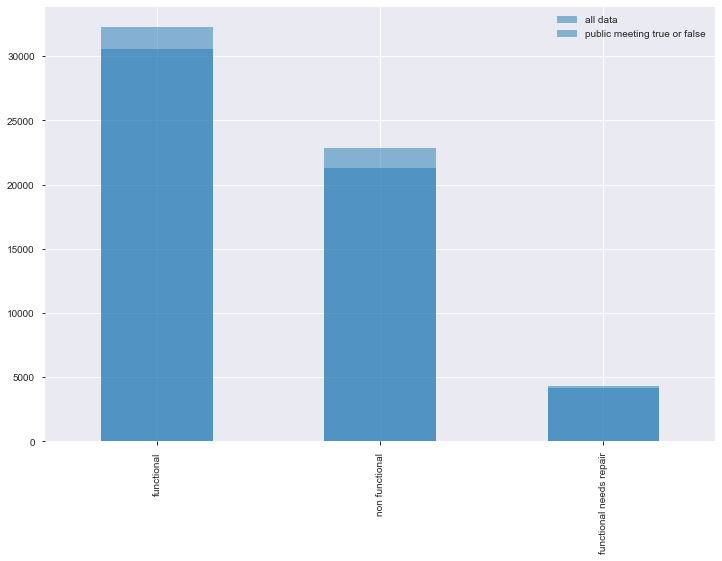

In [103]:
plt.figure(figsize=(12,8))
data.status_group.value_counts().plot(alpha=0.5, label='all data', kind='bar')
data[~data['public_meeting'].isna()].status_group.value_counts().plot(alpha=0.5, 
                                                                      label='public meeting true or false',
                                                                      kind='bar') 
plt.legend()
plt.show()

The NaN values are spread throughout the country, but there are very few for functional needs repair waterpumps.

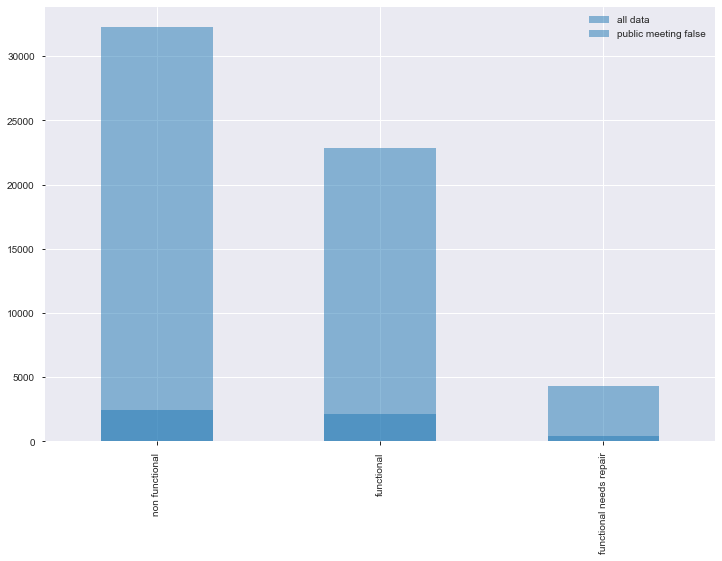

In [106]:
plt.figure(figsize=(12,8))
data.status_group.value_counts().plot(alpha=0.5, label='all data', kind='bar')
data[data['public_meeting'] == False].status_group.value_counts().plot(alpha=0.5, 
                                                                      label='public meeting false',
                                                                      kind='bar') 
plt.legend()
plt.show()

#### Findings

Because 85% of the values are True and the False/NaN values are spread fairly evenly.  I'm going to impute True for all the missing values.

#### Future Work

Find a better way to impute the missing values, maybe check nearby water pumps.

### recorded_by

Group entering this row of data

#### Findings

This feature has a constant value so it will be dropped.

### scheme_management

Who operates the waterpoint

In [107]:
data.stb.freq(['scheme_management'], style=True, cum_cols=False, sort_cols=True)

,scheme_management,Count,Percent
0,Company,"1,061",1.91%
1,None,1,0.00%
2,Other,766,1.38%
3,Parastatal,"1,680",3.03%
4,Private operator,"1,063",1.91%
5,SWC,97,0.17%
6,Trust,72,0.13%
7,VWC,"36,793",66.27%
8,WUA,"2,883",5.19%
9,WUG,"5,206",9.38%


In [109]:
data['scheme_management'].value_counts(normalize=True, dropna=False)

VWC                 0.619411
WUG                 0.087643
NaN                 0.065269
Water authority     0.053081
WUA                 0.048535
Water Board         0.046263
Parastatal          0.028283
Private operator    0.017896
Company             0.017862
Other               0.012896
SWC                 0.001633
Trust               0.001212
None                0.000017
Name: scheme_management, dtype: float64

VWC = village water committee

Where are the waterpumps with NaN?

In [110]:
draw_heatmap(data[data['scheme_management'].isna()])

In [111]:
draw_heatmap(data[data['scheme_management'] == 'VWC'])

#### Findings

Because there looks to be overlap of the NaN and the VWC, I will impute VWC for the NaN values as well as for 'None'

#### Future Work

Impute values for NaN with the mode of nearby waterpumps.

### scheme_name

Who operates the waterpoint

#### Findings

Almost half of the values are NaN, and it seems to be the actual name of the waterpoint operator or the type of waterpoint.  Imputing the missing values doesn't seem possible, given the variety as well as the unlikelihood that it has an impact on the functionality of the water pump. It will be dropped.  

### permit

If the waterpoint is permitted

In [112]:
data['permit'].value_counts(normalize=True, dropna=False)

True     0.654074
False    0.294478
NaN      0.051448
Name: permit, dtype: float64

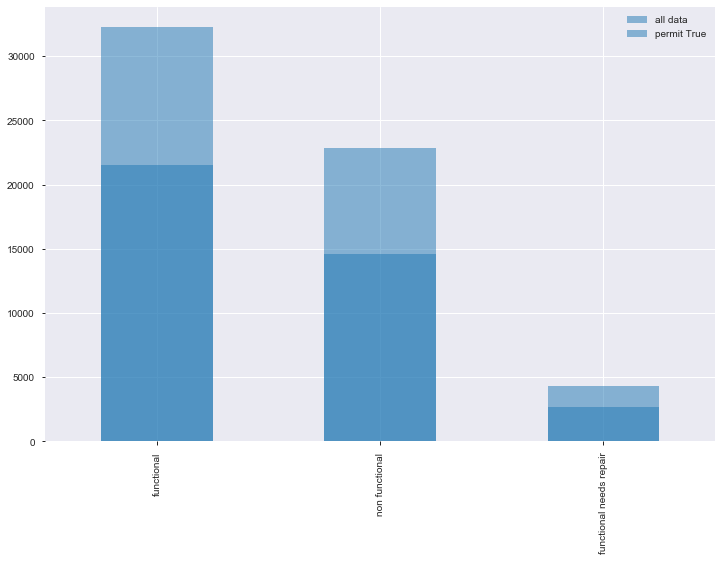

In [114]:
plt.figure(figsize=(12,8))
data.status_group.value_counts().plot(alpha=0.5, label='all data', kind='bar')
data[data['permit'] == True].status_group.value_counts().plot(alpha=0.5, 
                                                                      label='permit True',
                                                                      kind='bar') 
plt.legend()
plt.show()

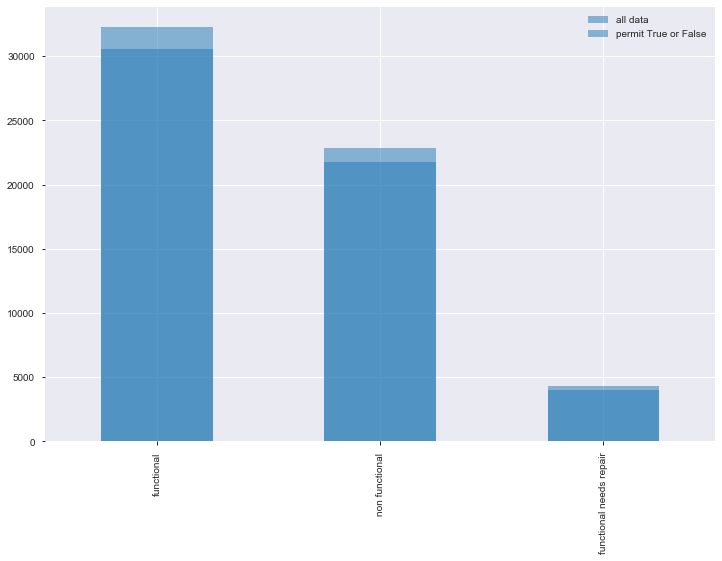

In [115]:
plt.figure(figsize=(12,8))
data.status_group.value_counts().plot(alpha=0.5, label='all data', kind='bar')
data[~data['permit'].isna()].status_group.value_counts().plot(alpha=0.5, 
                                                                      label='permit True or False',
                                                                      kind='bar') 
plt.legend()
plt.show()

#### Findings

I will impute the mode (True) for the NaN values.

#### Future Work

Impute the local mode for the Nan values rather than the country mode

### construction_year

Year the waterpoint was constructed

35% of the data is set to the placeholder zero, what is the histogram of the other data?

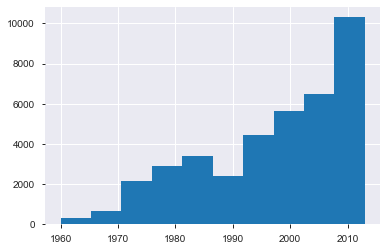

In [117]:
data[data['construction_year'] != 0]['construction_year'].hist()

In [118]:
print_data_range(data[data['construction_year'] != 0]['construction_year'])

min 1960
max 2013
mean 1996.8146855857951
median 2000.0
